# Metadata

```yaml
Course:   DS 5001
Module:   07 Lab
Author:   R.C. Alvarado
Date:     28 Februrary 2023 (revised)
```

**Purpose:**  To implement PCA from scratch and explore application to Austen-Melville corpus.

# Set Up

## Config

In [1]:
data_in = "../data/output"
data_out = "../data/output"
data_prefix = 'austen-melville'

In [2]:
OHCO = ['book_id', 'chap_num']

In [3]:
# Added after class
norm_docs = True # This has the effect of exaggerating variance when False
center_term_vectors = True # This has the effect of demoting authorship when False

We pick a color map for our gradient visualizations. For more info on color maps, see the [Matplotlib docs](https://matplotlib.org/stable/tutorials/colors/colormaps.html) on the subject.

In [4]:
# colors = "YlGnBu" 
colors = "Spectral"

## Import

In [5]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.linalg import norm

In [6]:
import plotly_express as px
import seaborn as sns

In [7]:
sns.set(style='ticks')

# Prepare the Data

## Import tables

In [8]:
LIB = pd.read_csv(f'{data_in}/{data_prefix}-LIB_FIXED.csv').set_index('book_id')
VOCAB = pd.read_csv(f'{data_in}/{data_prefix}-VOCAB2.csv').set_index('term_str')
BOW = pd.read_csv(f'{data_in}/{data_prefix}-BOW.csv').set_index(OHCO+['term_str'])

In [13]:
VOCAB[['n','p','i']].head(20)

,n,p,i
term_str,,,
the,109921,0.053387,4.227375
of,65525,0.031824,4.973725
and,62954,0.030576,5.031473
to,56271,0.027330,5.193379
a,44174,0.021455,5.542573
in,36439,0.017698,5.820287
i,27280,0.013249,6.237927
was,24231,0.011769,6.408917
that,23670,0.011496,6.442711


## Generate reduced `TFIDF` table

We reduce the feature space of the the TFIDF table by selecting the top 1000 significant nouns, verbs, and adjectives.

Note that the `TFIDF` table is an extension of an implied `DOC` table, where each doc is a chapter in this case.

In [9]:
TFIDF = BOW['tfidf'].unstack(fill_value=0) 
VSHORT = VOCAB[VOCAB.max_pos.isin(['NN', 'VB', 'JJ'])].sort_values('dfidf', ascending=False).head(1000)
TFIDF = TFIDF[VSHORT.index]

In [10]:
TFIDF

term_str             hands      sure     short       new      word    passed  \
book_id chap_num                                                               
105     1         0.000551  0.000000  0.000000  0.001107  0.000553  0.000545   
        2         0.000732  0.000000  0.001457  0.000000  0.000736  0.000000   
        3         0.000509  0.001019  0.000507  0.000000  0.000512  0.000000   
        4         0.000000  0.000000  0.002391  0.000000  0.000805  0.000000   
        5         0.000435  0.001305  0.000000  0.000874  0.000874  0.000000   
...                    ...       ...       ...       ...       ...       ...   
53861   8         0.000632  0.000000  0.001258  0.002541  0.000635  0.000000   
        11        0.000427  0.000853  0.000000  0.000429  0.000429  0.000845   
        13        0.000663  0.000000  0.000000  0.000000  0.000000  0.000000   
        14        0.000000  0.000518  0.000000  0.000000  0.002082  0.000000   
        15        0.000575  0.000575  0.001717  0.001734  0.002312  0.000000   

term_str              fine      name     sight     given  ...       mad  \
book_id chap_num                                          ...             
105     1         0.000555  0.001088  0.000000  0.002224  ...  0.000000   
        2         0.000000  0.000000  0.000000  0.000739  ...  0.000000   
        3         0.000000  0.003523  0.000514  0.000514  ...  0.000000   
        4         0.000807  0.000791  0.000000  0.001617  ...  0.000000   
        5         0.000438  0.000000  0.000000  0.000439  ...  0.000000   
...                    ...       ...       ...       ...  ...       ...   
53861   8         0.000000  0.001249  0.001277  0.000000  ...  0.002931   
        11        0.001719  0.000422  0.000431  0.000000  ...  0.000000   
        13        0.000668  0.000000  0.000669  0.000000  ...  0.000000   
        14        0.000000  0.000000  0.000523  0.000523  ...  0.000000   
        15        0.000000  0.001705  0.000581  0.000581  ...  0.000000   

term_str              legs   letters  intelligence  importance  friendly  \
book_id chap_num                                                           
105     1         0.000000  0.000000      0.000000    0.001281  0.000000   
        2         0.000000  0.000000      0.000000    0.003408  0.000000   
        3         0.000000  0.000000      0.000000    0.000000  0.000000   
        4         0.000000  0.000000      0.001856    0.001864  0.000000   
        5         0.000000  0.000000      0.000000    0.002025  0.001013   
...                    ...       ...           ...         ...       ...   
53861   8         0.000000  0.000000      0.000000    0.000000  0.000000   
        11        0.000000  0.000000      0.000000    0.000000  0.000000   
        13        0.001537  0.001537      0.000000    0.000000  0.001543   
        14        0.002402  0.000000      0.000000    0.000000  0.000000   
        15        0.004000  0.000000      0.000000    0.000000  0.000000   

term_str          language  bringing  beheld  news  
book_id chap_num                                    
105     1              0.0  0.000000     0.0   0.0  
        2              0.0  0.000000     0.0   0.0  
        3              0.0  0.001186     0.0   0.0  
        4              0.0  0.000000     0.0   0.0  
        5              0.0  0.000000     0.0   0.0  
...                    ...       ...     ...   ...  
53861   8              0.0  0.000000     0.0   0.0  
        11             0.0  0.000000     0.0   0.0  
        13             0.0  0.000000     0.0   0.0  
        14             0.0  0.000000     0.0   0.0  
        15             0.0  0.000000     0.0   0.0  

[1122 rows x 1000 columns]

## Add some labels to `LIB`

In [11]:
genre_csv = """
105, domestic, romance
121, gothic, satire
141, domestic, satire
158, domestic, romance
161, domestic, romance
946, domestic, romance
1212, domestic, satire
1342, domestic, romance
1900, travel, adventure
2701, sea, adventure
4045, travel, adventure
8118, sea, adventure
10712, sea, critical
13720, sea, adventure
13721, sea, adventure
15422, historical, adventure
15859, mixed, mixed
21816, travel, satire
34970, gothic, psychological
53861, mixed, mixed
""".split('\n')[1:-1]
genre = pd.DataFrame([line.split(', ') for line in genre_csv], columns=['book_id','genre', 'mode'])
genre.book_id = genre.book_id.astype('int')
genre = genre.set_index('book_id')

In [12]:
LIB = pd.concat([LIB, genre], axis=1)

In [13]:
LIB_COLS = ['author','title', 'label', 'genre', 'mode']

In [14]:
LIB[LIB_COLS].head()

,author,title,label,genre,mode
book_id,,,,,
105,"AUSTEN, JANE",PERSUASION,Austen: Persuasion (105),domestic,romance
121,"AUSTEN, JANE",NORTHANGER ABBEY,Austen: Northanger Abbey (121),gothic,satire
141,"AUSTEN, JANE",MANSFIELD PARK,Austen: Mansfield Park (141),domestic,satire
158,"AUSTEN, JANE",EMMA,Austen: Emma (158),domestic,romance
161,"AUSTEN, JANE",SENSE AND SENSIBILITY,Austen: Sense And Sensibilit (161),domestic,romance


# Begin PCA Process

## Normalize doc vector lengths

We use L2 normalization, which scales documents by their pythagorean (Euclidean) length.

In [15]:
# TFIDF_L2 = (TFIDF.T / np.sqrt(np.square(TFIDF).sum(axis=1))).T
TFIDF_L2 = (TFIDF.T / norm(TFIDF, 2, axis=1)).T

## Normalize term vector variance

We do **not** normalize variance, which we would normally do, such as with data containing divergent units of measure. \
This is because to do so would exaggerate the importance of rare words (see Ng, 2008: 6m40s–8m00s).

## Center the term vectors

We can take the column-wise means (the means for the _term_ vectors), but this alters the cosine angles between terms.

In [17]:
TFIDF_L2 = TFIDF_L2 - TFIDF_L2.mean()

## Compute Covariance Matrix

$n = |X| = |Y|$

$Cov(X,Y) = \dfrac{\sum_{i=1}^{n} (x_i - \mu_X) (y_i - \mu_Y)}{n - 1} = \dfrac{XY}{n-1}$

We could we use the built in Pandas method here, but compute it ourselves.

In [18]:
# COV = TFIDF_L2.cov() # This also centers the vectors
COV = TFIDF_L2.T.dot(TFIDF_L2) / (TFIDF_L2.shape[0] - 1)

In [19]:
COV.head()

term_str,hands,sure,short,new,word,passed,fine,name,sight,given,...,mad,legs,letters,intelligence,importance,friendly,language,bringing,beheld,news
term_str,,,,,,,,,,,,,,,,,,,,,
hands,0.000805,-0.000100,-0.000017,-0.000014,0.000003,0.000022,0.000030,0.000023,0.000065,-2.754638e-07,...,0.000047,0.000051,0.000011,0.000011,-0.000011,0.000021,0.000014,-2.854902e-05,0.000059,-0.000022
sure,-0.000100,0.000961,0.000081,-0.000010,0.000066,0.000036,0.000009,0.000049,-0.000031,7.265347e-05,...,-0.000054,-0.000059,0.000095,0.000014,0.000105,0.000018,0.000034,2.795093e-05,-0.000056,0.000167
short,-0.000017,0.000081,0.000392,-0.000014,0.000050,0.000041,0.000024,0.000018,-0.000011,6.882270e-05,...,-0.000030,0.000046,-0.000006,0.000012,0.000040,0.000013,0.000017,2.484771e-05,-0.000052,0.000006
new,-0.000014,-0.000010,-0.000014,0.000984,-0.000003,0.000027,0.000097,0.000039,0.000047,-1.667388e-05,...,-0.000007,0.000040,-0.000010,0.000004,0.000009,0.000016,0.000046,-8.541835e-07,0.000017,-0.000039
word,0.000003,0.000066,0.000050,-0.000003,0.000481,0.000014,0.000003,0.000069,-0.000008,4.731555e-05,...,-0.000032,0.000016,0.000083,0.000034,0.000026,0.000017,-0.000001,-3.190977e-06,-0.000023,0.000005


## Decompose the Matrix

There a at least three options to choose from. We go with SciPy's Hermitian Eigendecomposition \
method `eigh()`, since our covarience matrix is symmetric.

In [20]:
from scipy.linalg import eigh

In [21]:
eig_vals, eig_vecs = eigh(COV)

## Convert eigen data to dataframes

In [22]:
EIG_VEC = pd.DataFrame(eig_vecs, index=COV.index, columns=COV.index)
EIG_VAL = pd.DataFrame(eig_vals, index=COV.index, columns=['eig_val'])
EIG_VAL.index.name = 'term_str'

In [23]:
EIG_VEC.iloc[:10, :10].style.background_gradient(cmap=colors)

term_str,hands,sure,short,new,word,passed,fine,name,sight,given
term_str,,,,,,,,,,
hands,-0.040129,0.083470,-0.000011,-0.031187,0.021298,0.052320,-0.032962,0.038962,-0.019440,-0.014211
sure,0.028594,-0.002424,-0.022803,0.036473,0.004516,-0.024540,-0.003048,-0.056427,0.004886,0.013049
short,-0.016167,0.009343,0.000614,-0.035660,-0.001596,0.029778,0.056870,-0.073949,0.087916,0.040438
new,-0.032444,0.000455,0.016865,0.003609,-0.014625,0.003561,-0.038280,0.007493,0.003552,-0.004215
word,-0.032539,-0.019064,0.037680,0.011361,0.001229,0.010730,0.055064,0.096201,-0.003687,0.054620
passed,-0.012754,-0.032227,0.004725,0.028777,0.001643,0.013851,0.043570,-0.032846,-0.028382,-0.042260
fine,0.015461,-0.016202,0.024092,-0.001209,0.030883,0.013240,-0.020483,-0.009848,0.025800,-0.015303
name,-0.050427,-0.028878,-0.048210,-0.001343,0.023463,-0.019053,0.018717,0.040325,-0.028956,-0.033280
sight,0.000175,-0.006546,0.029485,-0.051371,-0.009525,-0.043634,-0.028634,0.082217,0.015835,0.013905


## Explore Term Pairs

In [24]:
EIG_VEC_PAIRS = EIG_VEC.stack().sort_values(ascending=False).to_frame('covariance')
EIG_VEC_PAIRS.index.names = ['term1', 'term2']

In [25]:
# EIG_VEC_PAIRS['label'] = EIG_VEC_PAIRS.apply(lambda x: '-'.join(x.name), axis=1)

In [26]:
EIG_VEC_PAIRS.head(20)

,,covariance
term1,term2,
pierre,beheld,0.828256
whale,bringing,0.767472
fish,addressed,0.611059
sir,uncle,0.556288
fish,last,0.527849
captain,alive,0.473697
thou,friendly,0.470909
wine,cry,0.449751
captain,legs,0.403805


In [27]:
# px.scatter(EIG_VEC_PAIRS.sample(10000).sort_values('covariance'), y='label', x='covariance', height=1000)

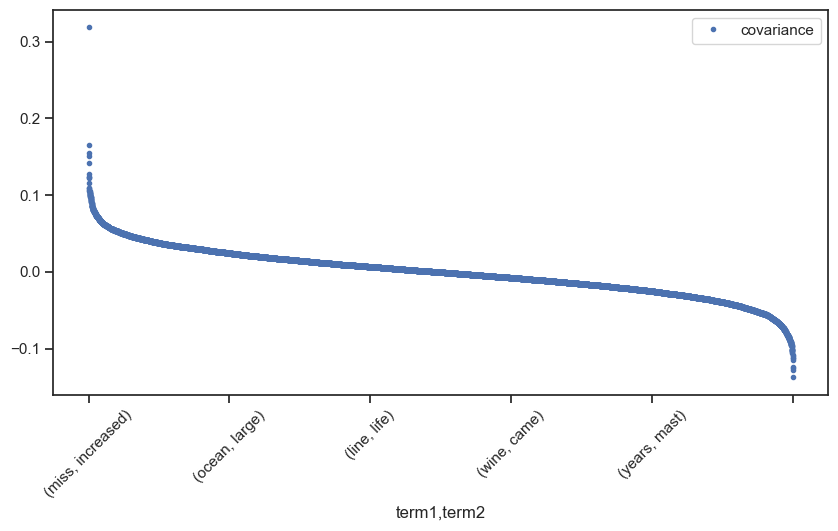

In [28]:
EIG_VEC_PAIRS.sample(10000).sort_values('covariance', ascending=False).plot(rot=45, style='.', figsize=(10,5));

## Select Principal Components

Next, we associate each eigenvalue with its corresponding *column* in the eigenvalue matrix. \
This is why we transpose the `EIG_VEC` dataframe.

## Combine eigenvalues and eignvectors

In [29]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)

In [30]:
EIG_PAIRS.sort_values('eig_val', ascending=False).head(10)

,eig_val,hands,sure,short,new,word,passed,fine,name,sight,...,mad,legs,letters,intelligence,importance,friendly,language,bringing,beheld,news
term_str,,,,,,,,,,,,,,,,,,,,,
news,0.058514,0.025464,-0.067037,-0.019331,0.007172,-0.014321,-0.012415,0.001326,-0.003739,0.016960,...,0.019839,0.017280,-0.023453,-0.014126,-0.022255,-0.007509,-0.007683,-0.006532,0.015825,-0.022273
beheld,0.041805,-0.020865,-0.003921,-0.012906,-0.011348,-0.005595,-0.004634,-0.011046,-0.008217,-0.020856,...,-0.006155,-0.017598,0.008154,0.000701,-0.003034,-0.005169,-0.005521,-0.006075,-0.007948,-0.004306
bringing,0.021089,-0.011231,0.007566,-0.008885,-0.018115,-0.002004,-0.012842,-0.020186,-0.016947,-0.009137,...,-0.005986,-0.018892,0.003816,0.001475,0.001988,-0.007477,-0.008056,-0.007370,0.002502,0.000379
language,0.018494,-0.016706,-0.005323,-0.016435,0.007462,-0.010398,-0.000406,-0.010688,-0.012657,-0.005354,...,0.013775,0.004425,-0.008726,-0.003130,-0.012326,0.001030,-0.000297,-0.003500,0.017252,-0.008009
friendly,0.014651,0.022962,0.020735,-0.003938,-0.023907,0.014752,0.001146,-0.019549,0.000143,-0.003085,...,0.028593,0.001539,0.001759,-0.011357,0.004253,-0.014971,-0.012822,-0.002657,-0.018949,0.010847
importance,0.010784,-0.002620,0.003241,-0.023668,-0.014749,-0.010096,-0.037063,-0.001703,-0.006606,-0.046255,...,0.037499,-0.010130,0.008529,-0.012729,0.002184,-0.012620,-0.010137,-0.010501,-0.026196,0.003023
intelligence,0.010105,-0.011318,-0.017842,-0.021606,-0.009451,-0.027338,0.014530,-0.010506,-0.016948,0.006114,...,-0.001912,-0.027032,-0.001862,0.015405,0.011511,-0.009161,0.001320,0.012407,0.028753,-0.001247
letters,0.009264,0.018869,0.025739,-0.005832,0.017334,0.023417,0.018532,0.031873,-0.013132,0.028472,...,0.015607,0.022404,-0.000574,-0.014222,-0.013151,0.006117,-0.026371,-0.003727,0.009745,0.006363
legs,0.007981,0.002138,0.040691,0.027489,0.032116,0.029439,0.021649,0.030929,0.023471,0.008080,...,0.004950,0.011244,0.021337,0.011767,0.016632,0.009399,0.015486,0.011387,-0.003582,0.013890


Next, we sort in descending order and pick the top K (=10).

## Compute and Show Explained Variance

We might have usd this value to sort our components.

In [31]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

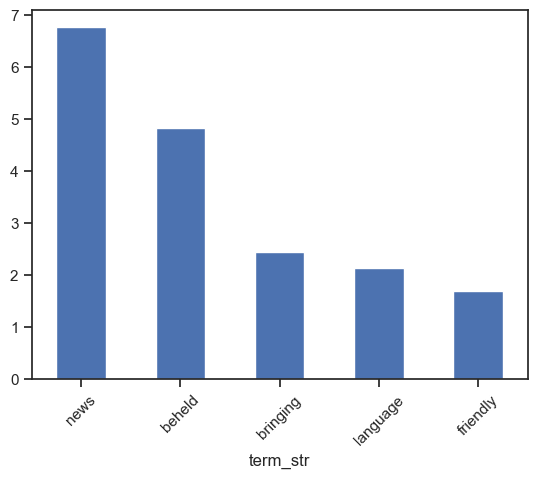

In [32]:
EIG_PAIRS.exp_var.sort_values(ascending=False).head().plot.bar(rot=45);

## Pick Top K (10) Components

We pick these based on explained variance.

In [33]:
COMPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
COMPS.index.name = 'comp_id'
COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]
COMPS.index.name = 'pc_id'

In [34]:
COMPS

,eig_val,hands,sure,short,new,word,passed,fine,name,sight,...,legs,letters,intelligence,importance,friendly,language,bringing,beheld,news,exp_var
pc_id,,,,,,,,,,,,,,,,,,,,,
PC0,0.058514,0.025464,-0.067037,-0.019331,0.007172,-0.014321,-0.012415,0.001326,-0.003739,0.016960,...,0.017280,-0.023453,-0.014126,-0.022255,-0.007509,-0.007683,-0.006532,0.015825,-0.022273,6.76
PC1,0.041805,-0.020865,-0.003921,-0.012906,-0.011348,-0.005595,-0.004634,-0.011046,-0.008217,-0.020856,...,-0.017598,0.008154,0.000701,-0.003034,-0.005169,-0.005521,-0.006075,-0.007948,-0.004306,4.83
PC2,0.021089,-0.011231,0.007566,-0.008885,-0.018115,-0.002004,-0.012842,-0.020186,-0.016947,-0.009137,...,-0.018892,0.003816,0.001475,0.001988,-0.007477,-0.008056,-0.007370,0.002502,0.000379,2.44
PC3,0.018494,-0.016706,-0.005323,-0.016435,0.007462,-0.010398,-0.000406,-0.010688,-0.012657,-0.005354,...,0.004425,-0.008726,-0.003130,-0.012326,0.001030,-0.000297,-0.003500,0.017252,-0.008009,2.14
PC4,0.014651,0.022962,0.020735,-0.003938,-0.023907,0.014752,0.001146,-0.019549,0.000143,-0.003085,...,0.001539,0.001759,-0.011357,0.004253,-0.014971,-0.012822,-0.002657,-0.018949,0.010847,1.69
PC5,0.010784,-0.002620,0.003241,-0.023668,-0.014749,-0.010096,-0.037063,-0.001703,-0.006606,-0.046255,...,-0.010130,0.008529,-0.012729,0.002184,-0.012620,-0.010137,-0.010501,-0.026196,0.003023,1.25
PC6,0.010105,-0.011318,-0.017842,-0.021606,-0.009451,-0.027338,0.014530,-0.010506,-0.016948,0.006114,...,-0.027032,-0.001862,0.015405,0.011511,-0.009161,0.001320,0.012407,0.028753,-0.001247,1.17
PC7,0.009264,0.018869,0.025739,-0.005832,0.017334,0.023417,0.018532,0.031873,-0.013132,0.028472,...,0.022404,-0.000574,-0.014222,-0.013151,0.006117,-0.026371,-0.003727,0.009745,0.006363,1.07
PC8,0.007981,0.002138,0.040691,0.027489,0.032116,0.029439,0.021649,0.030929,0.023471,0.008080,...,0.011244,0.021337,0.011767,0.016632,0.009399,0.015486,0.011387,-0.003582,0.013890,0.92


In [35]:
# COMPS.iloc[:,1:-1].T.sort_values('PC1', ascending=False).head(10).index

## See Projected Components onto Vocabulary (Loadings)

Loadings sow the contribution of each term to the component. \
We'll just look at the topi 10 words for the first two components in the Book version.

In [36]:
LOADINGS = COMPS[COV.index].T
LOADINGS.index.name = 'term_str'

In [37]:
LOADINGS.head(10).style.background_gradient(cmap=colors)

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_str,,,,,,,,,,
hands,0.025464,-0.020865,-0.011231,-0.016706,0.022962,-0.002620,-0.011318,0.018869,0.002138,0.004945
sure,-0.067037,-0.003921,0.007566,-0.005323,0.020735,0.003241,-0.017842,0.025739,0.040691,0.024554
short,-0.019331,-0.012906,-0.008885,-0.016435,-0.003938,-0.023668,-0.021606,-0.005832,0.027489,-0.008235
new,0.007172,-0.011348,-0.018115,0.007462,-0.023907,-0.014749,-0.009451,0.017334,0.032116,-0.006977
word,-0.014321,-0.005595,-0.002004,-0.010398,0.014752,-0.010096,-0.027338,0.023417,0.029439,-0.015472
passed,-0.012415,-0.004634,-0.012842,-0.000406,0.001146,-0.037063,0.014530,0.018532,0.021649,0.018960
fine,0.001326,-0.011046,-0.020186,-0.010688,-0.019549,-0.001703,-0.010506,0.031873,0.030929,-0.047024
name,-0.003739,-0.008217,-0.016947,-0.012657,0.000143,-0.006606,-0.016948,-0.013132,0.023471,-0.021746
sight,0.016960,-0.020856,-0.009137,-0.005354,-0.003085,-0.046255,0.006114,0.028472,0.008080,0.021160


In [152]:
top_terms = []
for i in range(10):
    for j in [0, 1]:
        comp_str = ' '.join(LOADINGS.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())
        top_terms.append((f"PC{i}", j, comp_str))
COMP_GLOSS = pd.DataFrame(top_terms).set_index([0,1]).unstack()
COMP_GLOSS.index.name = 'comp_id'
COMP_GLOSS.columns = COMP_GLOSS.columns.droplevel(0) 
COMP_GLOSS = COMP_GLOSS.rename(columns={0:'pos', 1:'neg'})

In [151]:
COMP_GLOSS

1,pos,neg
comp_id,,
PC0,pierre whale thou sea ship ye thee deck thy boat,mr mrs miss lady am sister dear think sir letter
PC1,pierre thou thee thy mother sister brother sou...,whale captain ship deck sea boat sailors ships...
PC2,whale whales thou mr boat fish boats thee mrs ye,captain sailors doctor war deck officers mate ...
PC3,lord thou king thy thee ye kings wine cried oh,pierre captain whale ship deck sailors boat ma...
PC4,thou thee thy captain ye mr deck sir ship mate,island king lord pierre whale doctor fish king...
PC5,lord war king sir officers captain american ki...,doctor thou thee boat island trees house thy b...
PC6,mr mrs sea war king land miss officers island ...,sir dont doctor confidence ye yes said strange...
PC7,mr miss lord pierre mrs ye cried said king dont,lady sir thou letter thee mother daughter affe...
PC8,captain lord king whale thou sister miss islan...,mr sir deck dont top yard confidence doctor ma...


In [155]:
# COMPS.join(COMP_GLOSS)

## Project Docs onto Components

We get the dot product of the DTM matrix and the new component matrix, which we will call DCM -- for document-component matrix. \
This has the effect of replacing the features of the DTM with the features of the transposed component matrix.

In [40]:
# We use the index to get only PC features, so matrices align
DCM = TFIDF_L2.dot(COMPS[COV.index].T) 

We add metadata to our new, reduced matrices for display purposes.

In [41]:
DCM = DCM.join(LIB[LIB_COLS], on='book_id')

We define a `doc` field to name each chapter.

In [42]:
DCM['doc'] = DCM.apply(lambda x: f"{x.label} {str(x.name[1]).zfill(2)}", 1)

In [43]:
DCM.doc

book_id  chap_num
105      1                         Austen: Persuasion (105) 01
         2                         Austen: Persuasion (105) 02
         3                         Austen: Persuasion (105) 03
         4                         Austen: Persuasion (105) 04
         5                         Austen: Persuasion (105) 05
                                       ...                    
53861    8           Melville: The Apple Tree Table (53861) 08
         11          Melville: The Apple Tree Table (53861) 11
         13          Melville: The Apple Tree Table (53861) 13
         14          Melville: The Apple Tree Table (53861) 14
         15          Melville: The Apple Tree Table (53861) 15
Name: doc, Length: 1122, dtype: object

In [167]:
DCM

PC0       PC1       PC2       PC3       PC4       PC5  \
book_id chap_num                                                               
105     1        -0.258194  0.021880  0.000662 -0.006404 -0.050144  0.108286   
        2        -0.282113  0.005740  0.010760 -0.012092  0.004768  0.083195   
        3        -0.333656 -0.025897 -0.005075 -0.016225  0.099874  0.144990   
        4        -0.218830  0.001499 -0.024153 -0.036806 -0.065394  0.019683   
        5        -0.418765 -0.008381 -0.007632 -0.041837  0.008895 -0.042968   
...                    ...       ...       ...       ...       ...       ...   
53861   8         0.011856 -0.035623 -0.073122  0.089387 -0.063217  0.021528   
        11       -0.031021 -0.029830 -0.059528  0.075594 -0.017600  0.011989   
        13        0.067223 -0.066849 -0.087473  0.158152 -0.103119  0.104208   
        14        0.044615 -0.017261 -0.012542  0.064434 -0.025122  0.024308   
        15        0.145206 -0.178524 -0.150968 -0.141565  0.004949  0.042027   

                       PC6       PC7       PC8       PC9            author  \
book_id chap_num                                                             
105     1        -0.047221 -0.273626 -0.130853 -0.027812      AUSTEN, JANE   
        2        -0.098718 -0.263987 -0.172909 -0.034577      AUSTEN, JANE   
        3        -0.114713  0.000175 -0.229175 -0.145756      AUSTEN, JANE   
        4        -0.003133 -0.279514  0.070245  0.039107      AUSTEN, JANE   
        5        -0.024169 -0.013668  0.049180 -0.029238      AUSTEN, JANE   
...                    ...       ...       ...       ...               ...   
53861   8        -0.157706  0.064548  0.049580 -0.006945  MELVILLE, HERMAN   
        11       -0.267721 -0.006188 -0.072426 -0.002192  MELVILLE, HERMAN   
        13       -0.171239  0.082420 -0.007382 -0.042054  MELVILLE, HERMAN   
        14       -0.093322 -0.044345 -0.113046  0.046405  MELVILLE, HERMAN   
        15       -0.029857 -0.034203  0.115870 -0.123533  MELVILLE, HERMAN   

                                                    title  \
book_id chap_num                                            
105     1                                      PERSUASION   
        2                                      PERSUASION   
        3                                      PERSUASION   
        4                                      PERSUASION   
        5                                      PERSUASION   
...                                                   ...   
53861   8         THE APPLE TREE TABLE AND OTHER SKETCHES   
        11        THE APPLE TREE TABLE AND OTHER SKETCHES   
        13        THE APPLE TREE TABLE AND OTHER SKETCHES   
        14        THE APPLE TREE TABLE AND OTHER SKETCHES   
        15        THE APPLE TREE TABLE AND OTHER SKETCHES   

                                                   label     genre     mode  \
book_id chap_num                                                              
105     1                       Austen: Persuasion (105)  domestic  romance   
        2                       Austen: Persuasion (105)  domestic  romance   
        3                       Austen: Persuasion (105)  domestic  romance   
        4                       Austen: Persuasion (105)  domestic  romance   
        5                       Austen: Persuasion (105)  domestic  romance   
...                                                  ...       ...      ...   
53861   8         Melville: The Apple Tree Table (53861)     mixed    mixed   
        11        Melville: The Apple Tree Table (53861)     mixed    mixed   
        13        Melville: The Apple Tree Table (53861)     mixed    mixed   
        14        Melville: The Apple Tree Table (53861)     mixed    mixed   
        15        Melville: The Apple Tree Table (53861)     mixed    mixed   

                                                        doc  
book_id chap_num                                             
105     1            

# Visualize

In [44]:
def vis_pcs(M, a, b, label='author', hover_name='doc', symbol=None, size=None):
    fig = px.scatter(M, f"PC{a}", f"PC{b}", color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)
    fig.show()

In [45]:
def vis_loadings(a=0, b=1, hover_name='term_str'):
    X = LOADINGS.join(VOCAB)
    return px.scatter(X.reset_index(), f"PC{a}", f"PC{b}", 
                      text='term_str', size='i', color='max_pos', 
                      marginal_x='box', height=800)

## PC 0 and 1

### Author

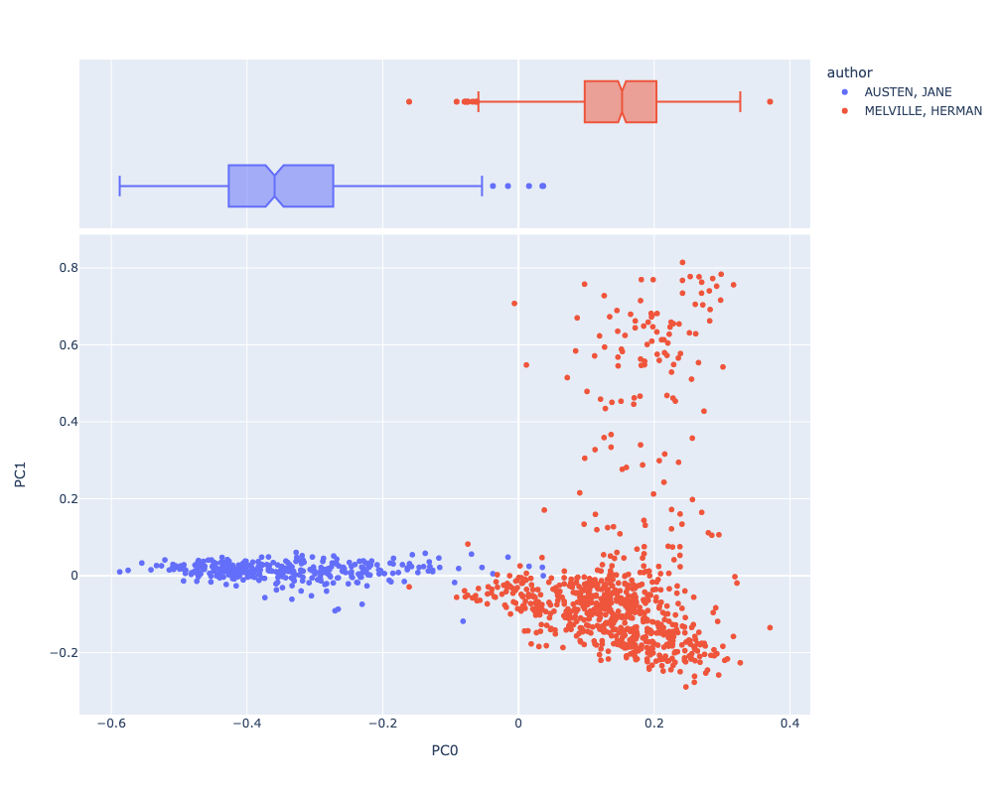

In [46]:
vis_pcs(DCM, 0, 1)

### Loadings

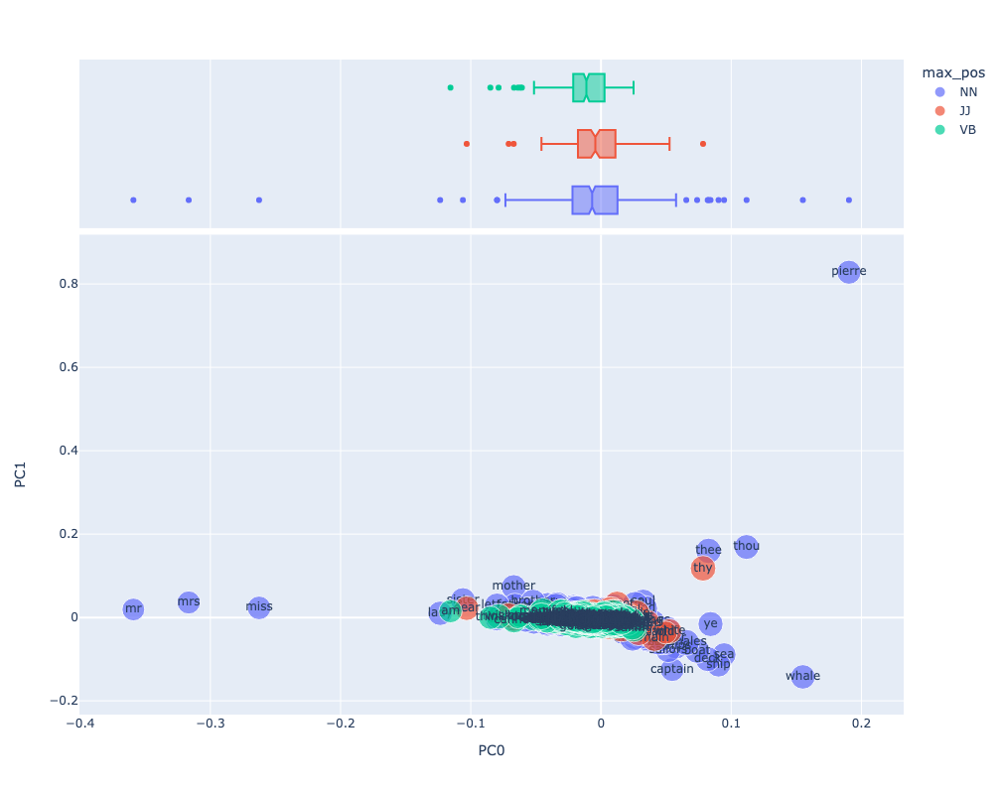

In [168]:
vis_loadings(0,1)

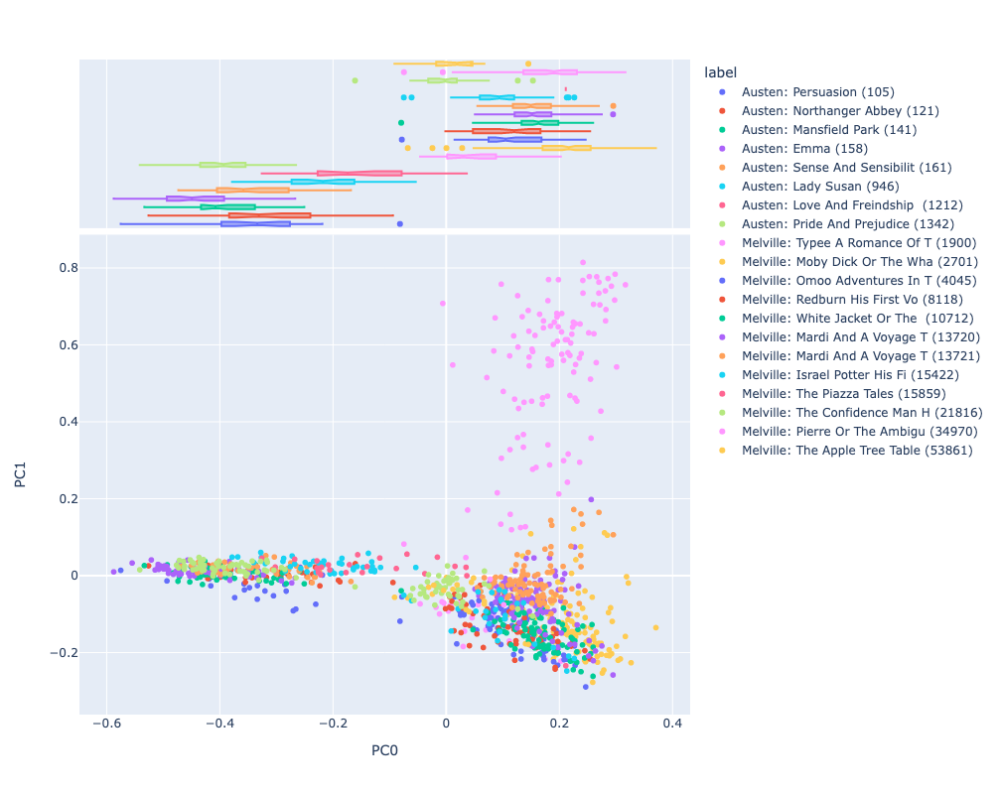

In [156]:
vis_pcs(DCM, 0, 1, label='label')

### Genre

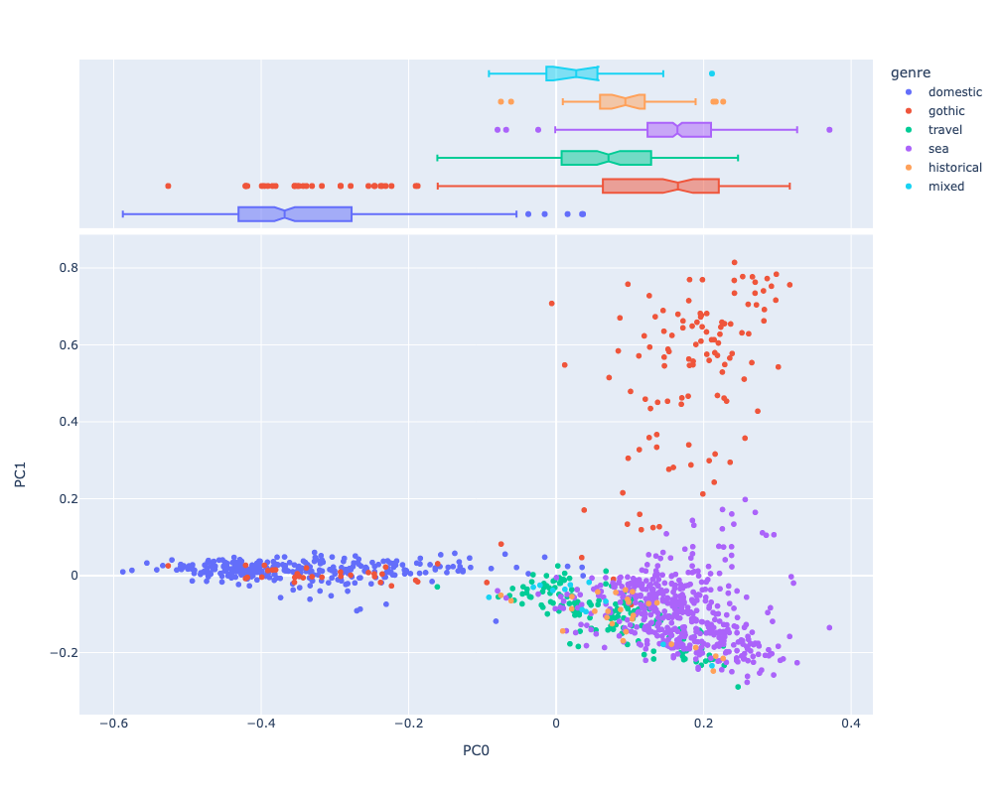

In [157]:
vis_pcs(DCM, 0, 1, label='genre')

### Mode

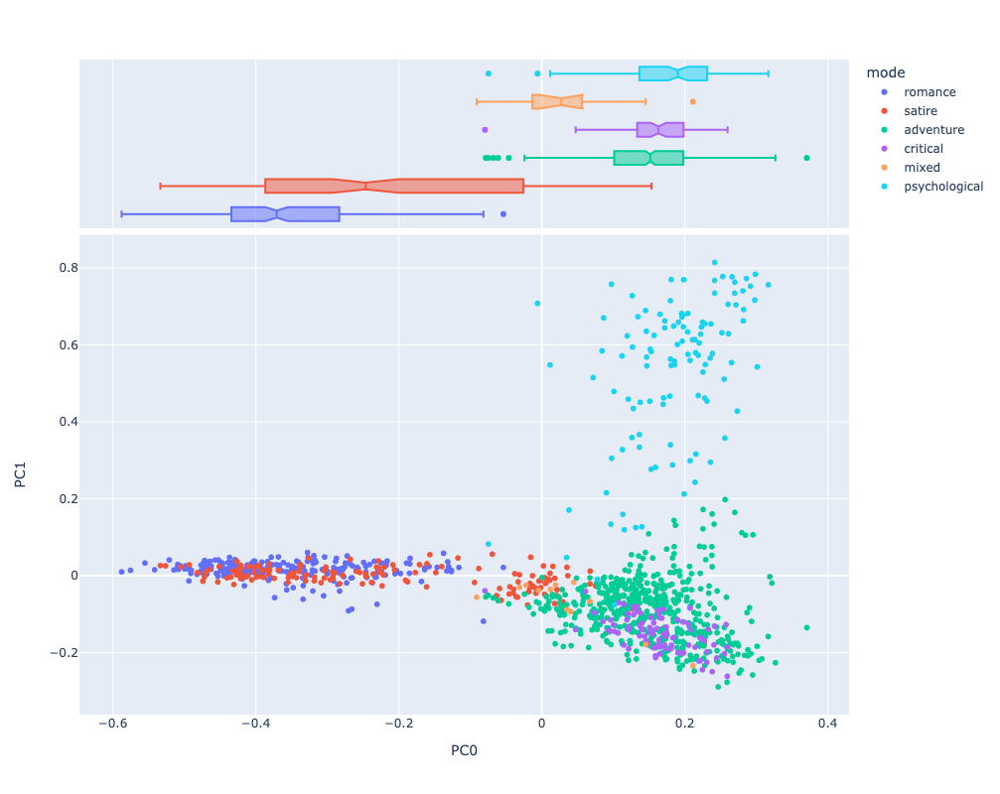

In [158]:
vis_pcs(DCM, 0, 1, label='mode')

### Title

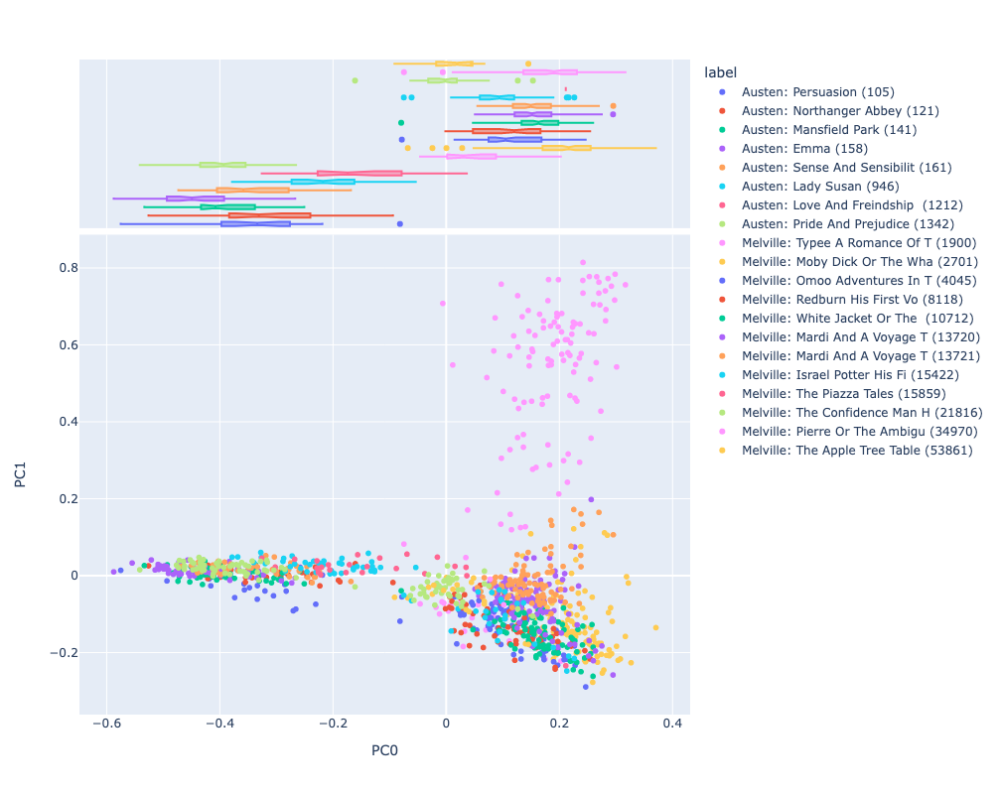

In [159]:
vis_pcs(DCM, 0, 1, label='label')

## PC 1 and 2

### Author

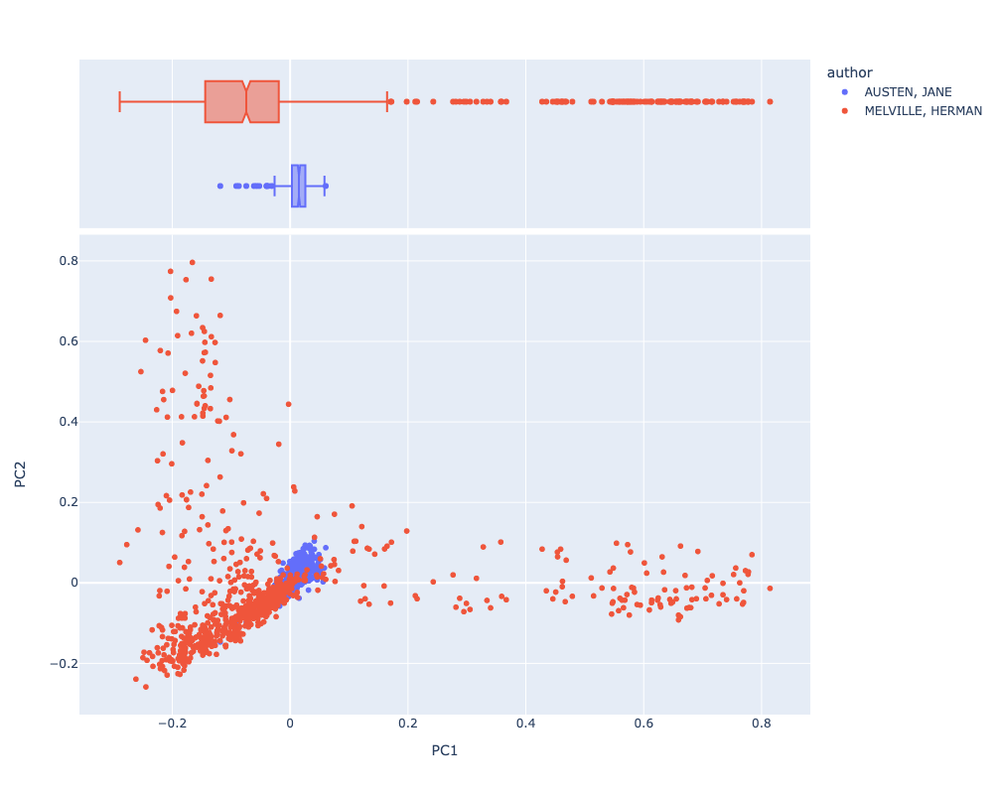

In [52]:
vis_pcs(DCM, 1, 2)

### Loadings

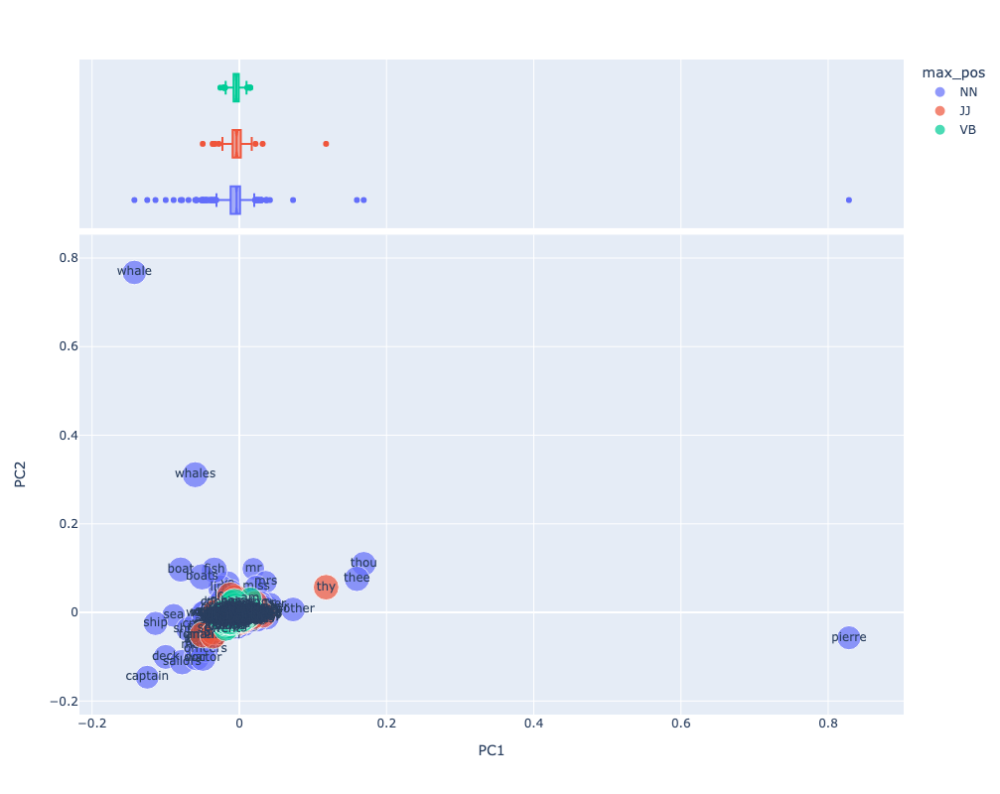

In [53]:
vis_loadings(1, 2)

### Genre

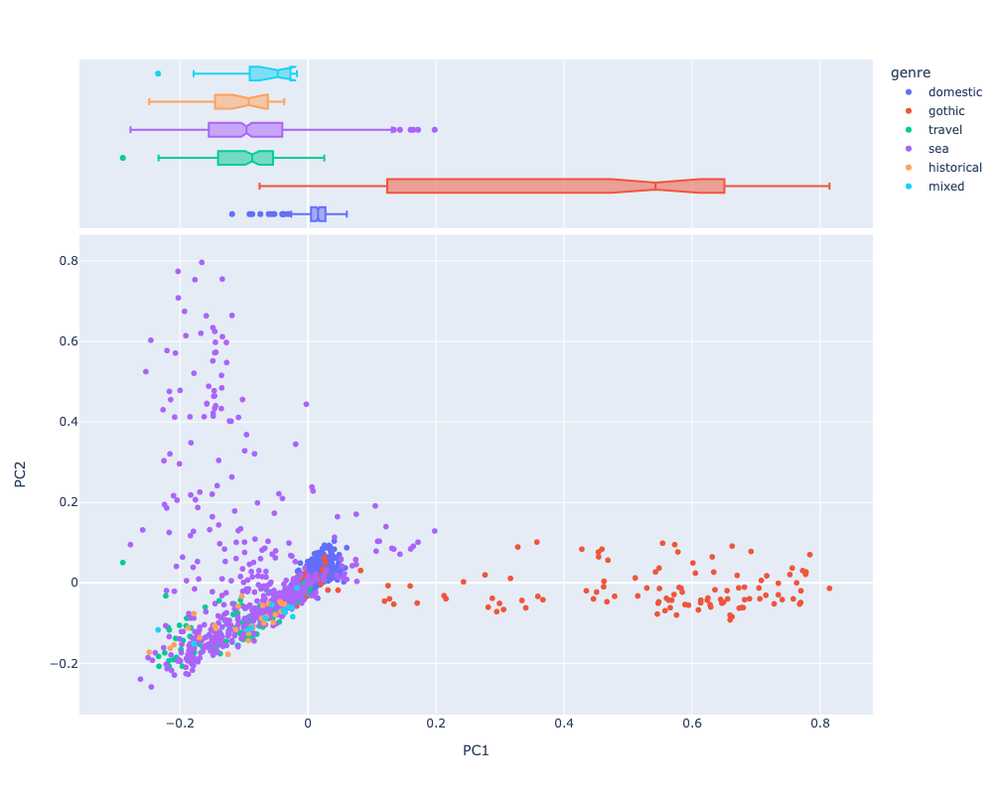

In [160]:
vis_pcs(DCM, 1, 2, label='genre')

### Mode

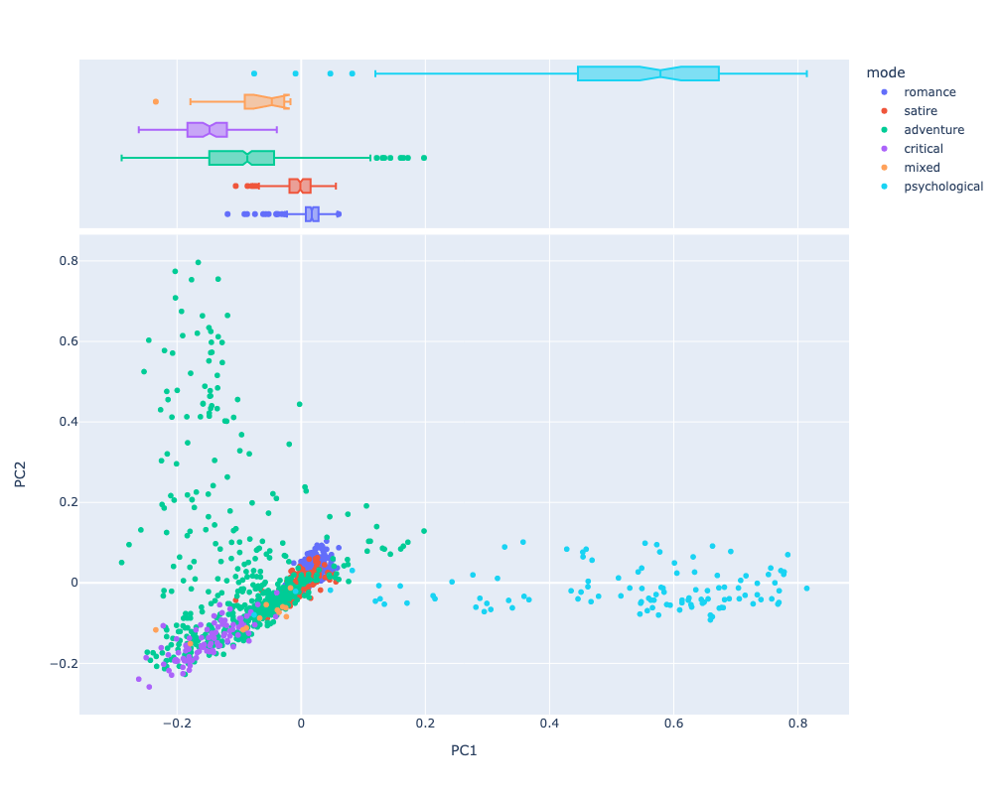

In [161]:
vis_pcs(DCM, 1, 2, label='mode')

### Title

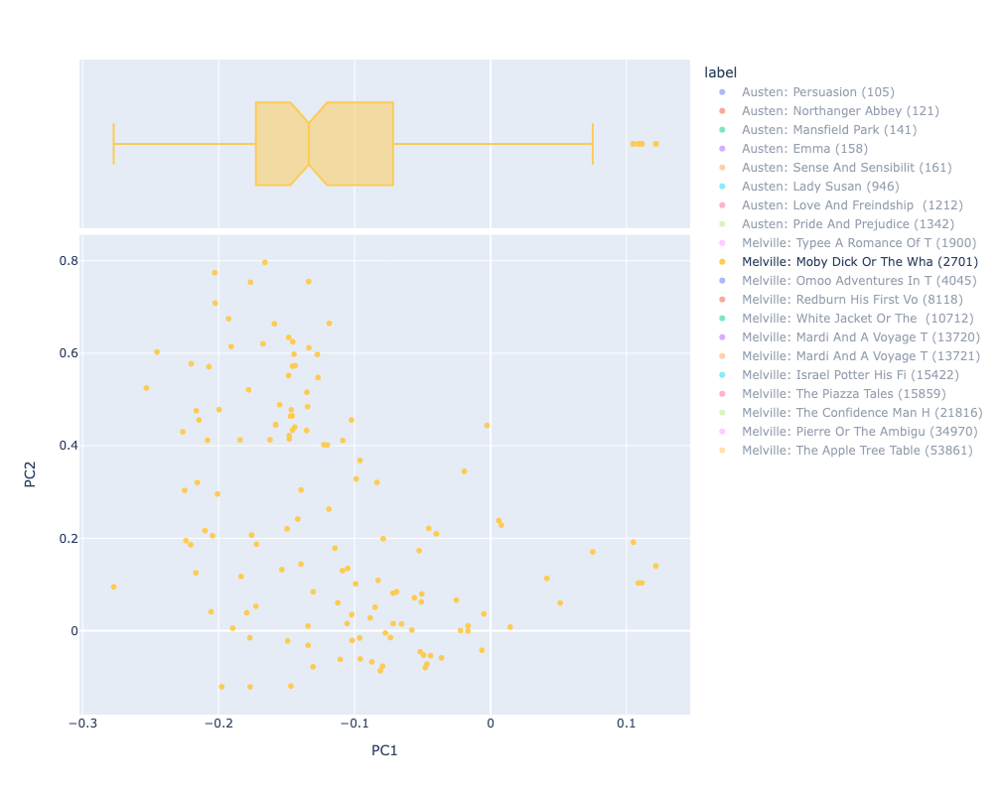

In [162]:
vis_pcs(DCM, 1, 2, label='label')

## PC 2 and 3

### Author

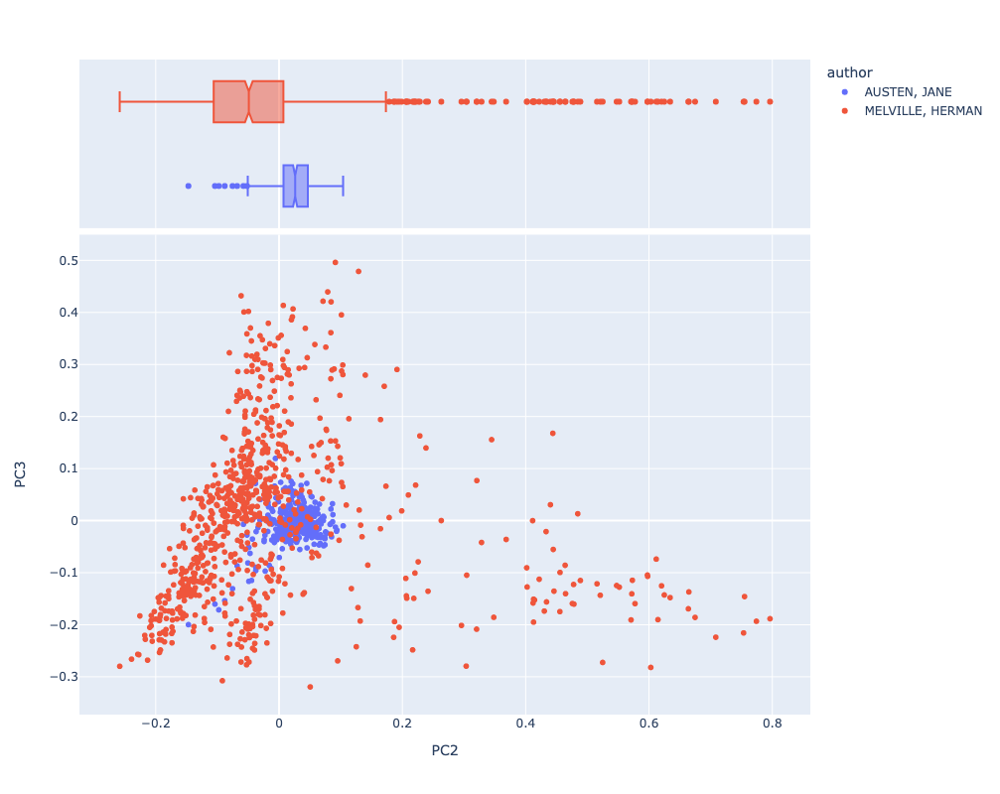

In [57]:
vis_pcs(DCM, 2, 3)

### Loadings

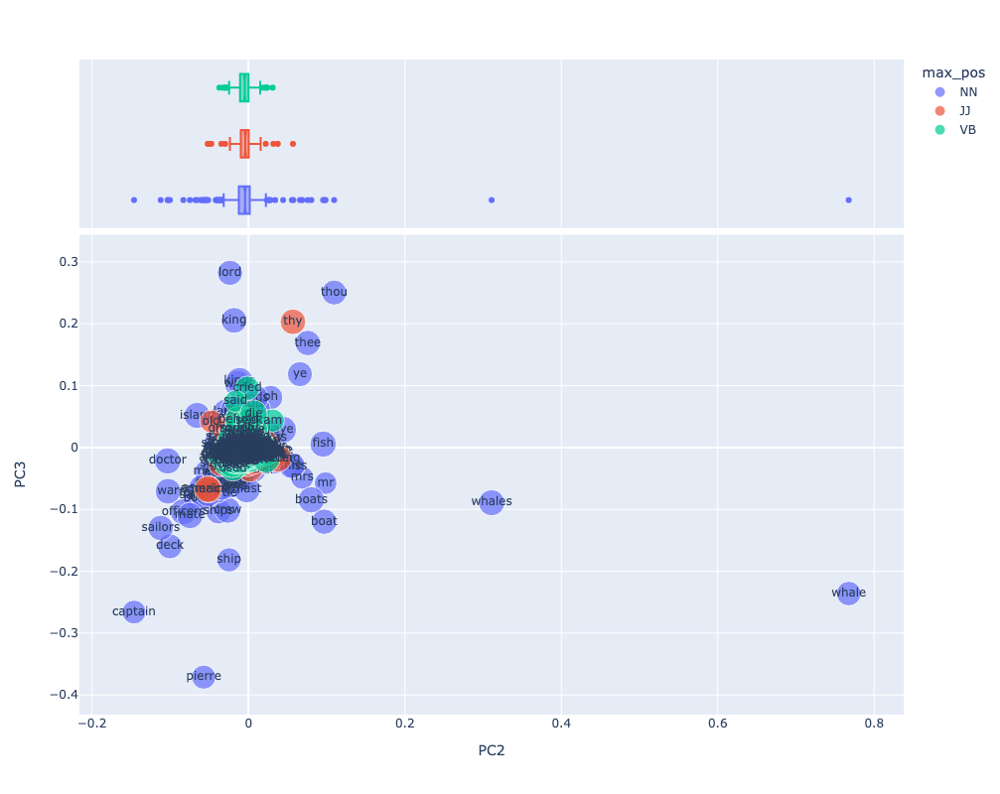

In [58]:
vis_loadings(2, 3)

### Genre

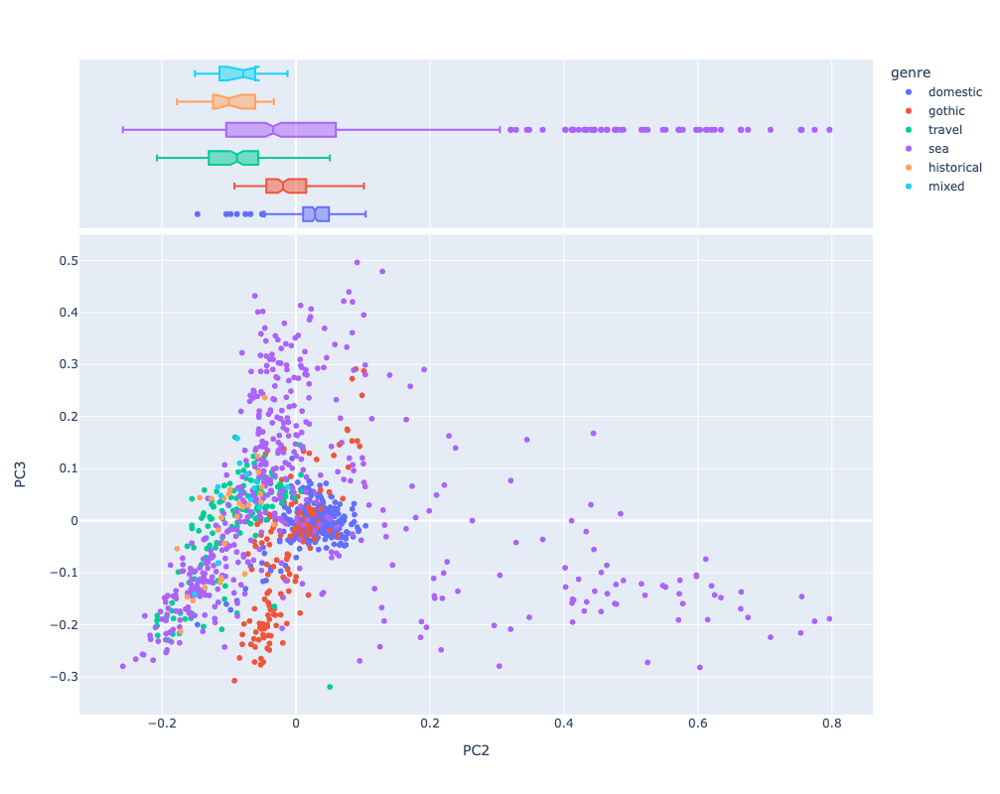

In [163]:
vis_pcs(DCM, 2, 3, label='genre')

### Mode

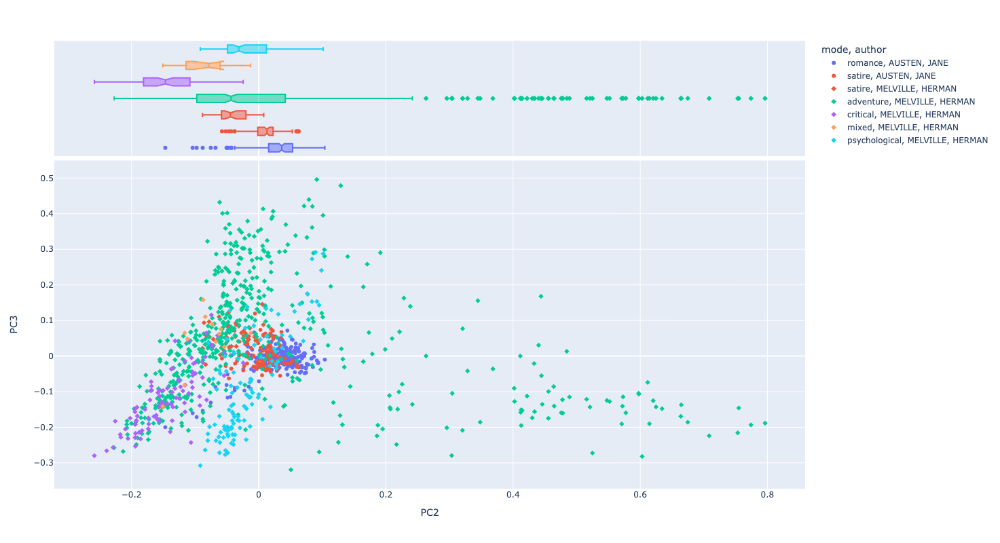

In [60]:
vis_pcs(DCM, 2, 3, label='mode', symbol='author')

### Title

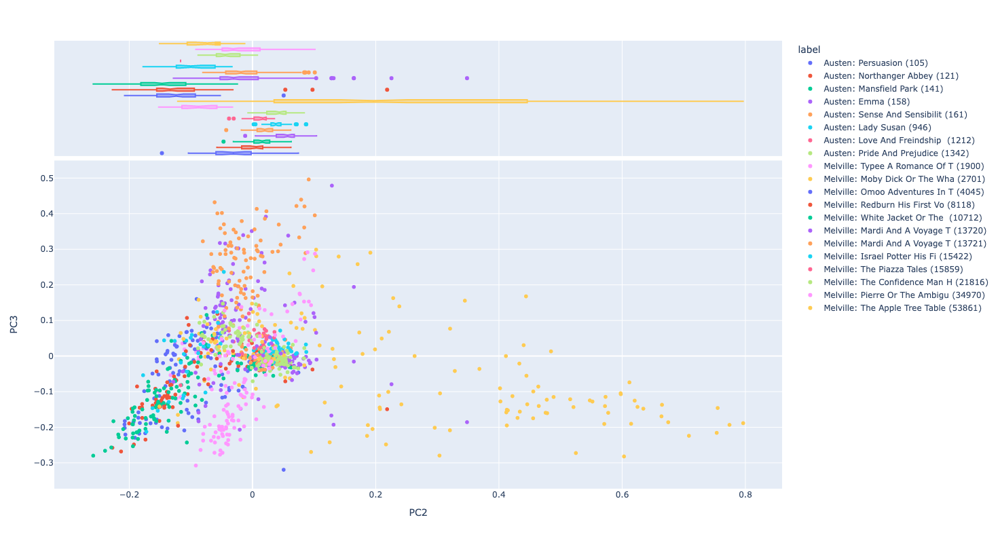

In [164]:
vis_pcs(DCM, 2, 3, label='label')

## PC 3 and 4

### Author

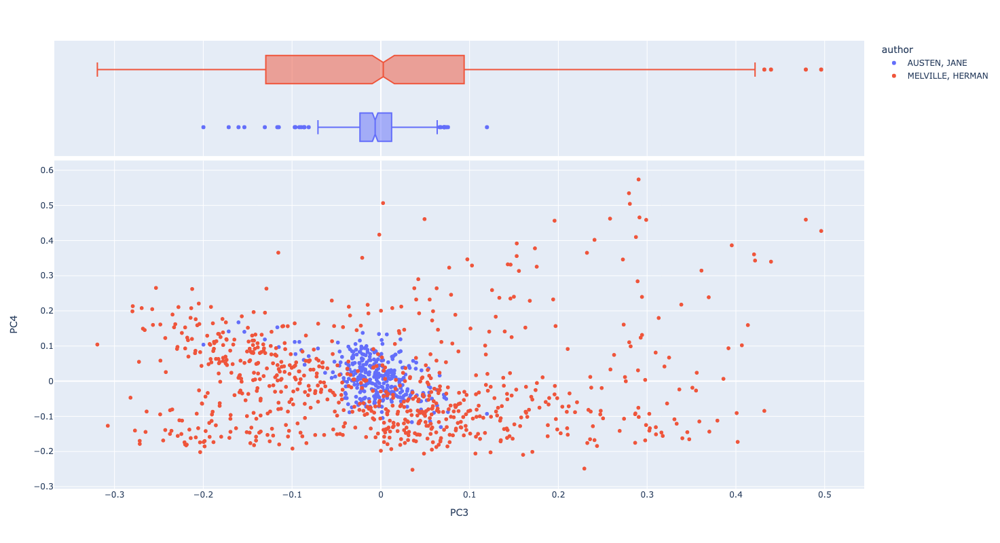

In [62]:
vis_pcs(DCM, 3, 4, label='author')

### Loadings

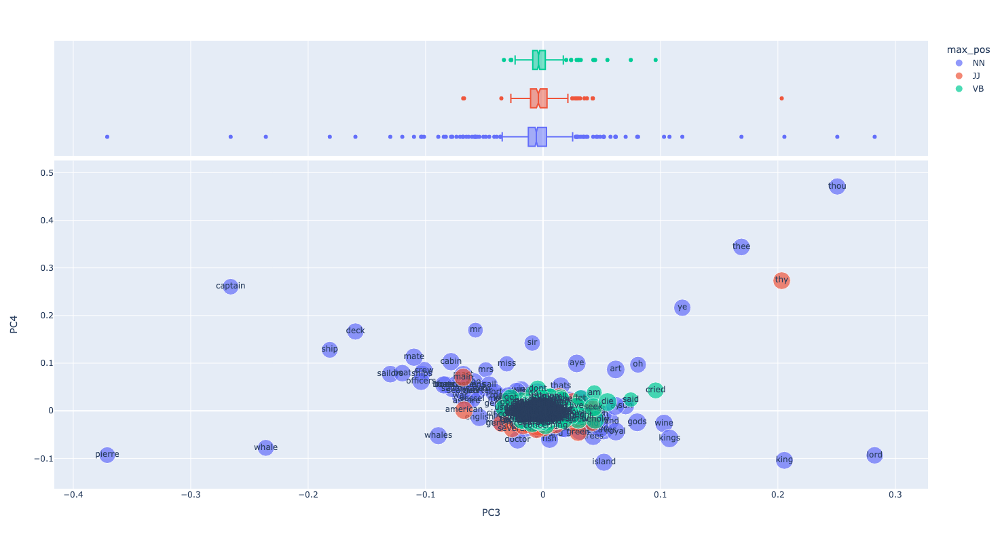

In [63]:
vis_loadings(3, 4)

### Genre

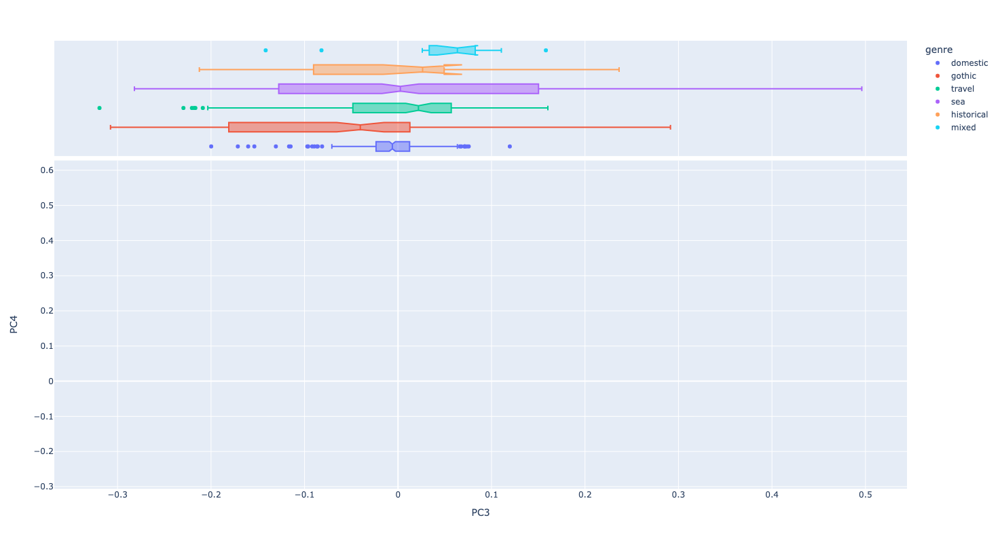

In [165]:
vis_pcs(DCM, 3, 4, label='genre')

### Mode

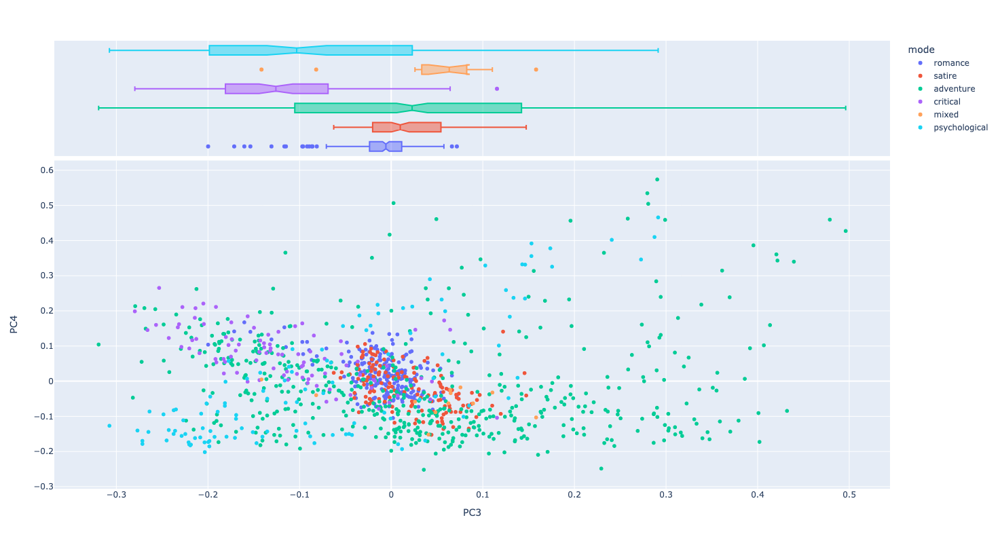

In [166]:
vis_pcs(DCM, 3, 4, label='mode')

### Title

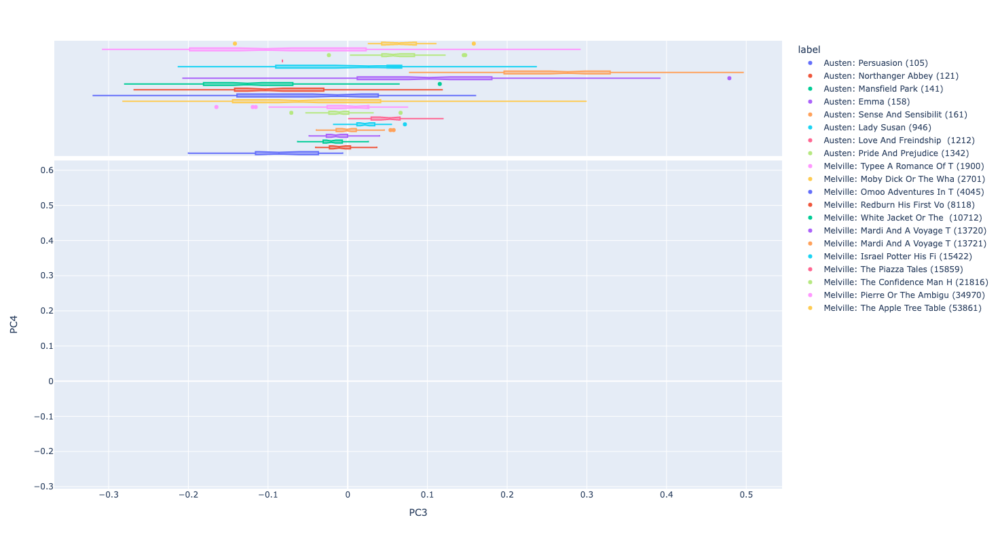

In [66]:
vis_pcs(DCM, 3, 4, label='label')

## Dendrograms

In [67]:
import plotly.figure_factory as ff
from plotly.figure_factory import create_dendrogram # Built on top SciPy

In [68]:
import sys
sys.path.append("../lib/")
from hac import HAC

In [69]:
X = DCM[COMPS.index].groupby('book_id').mean()
titles = LIB.loc[list(X.index)].apply(lambda x: x.label + ' ' + x.genre.upper(), 1)
X.index = titles

In [70]:
X.style.background_gradient(cmap=colors)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
Austen: Persuasion (105) DOMESTIC,-0.337339,-0.030639,-0.031818,-0.082493,0.068204,0.022100,-0.023884,-0.044776,0.102757,-0.029852
Austen: Northanger Abbey (121) GOTHIC,-0.311272,0.002734,0.000302,-0.007698,-0.003322,-0.048677,-0.018883,0.012611,0.077034,0.017821
Austen: Mansfield Park (141) DOMESTIC,-0.393960,0.004963,0.014752,-0.019167,0.025004,-0.018449,-0.040252,-0.006535,0.034147,0.017288
Austen: Emma (158) DOMESTIC,-0.437665,0.013314,0.053744,-0.013372,0.054106,-0.001842,0.065122,0.135799,-0.042628,-0.052706
Austen: Sense And Sensibilit (161) DOMESTIC,-0.345486,0.018119,0.018382,0.000061,-0.017641,-0.022750,0.005833,-0.063945,0.078027,0.088308
Austen: Lady Susan (946) DOMESTIC,-0.219799,0.028178,0.039861,0.023420,-0.025046,0.073718,0.033663,-0.151953,-0.096876,0.045382
Austen: Love And Freindship (1212) DOMESTIC,-0.157199,0.025008,0.010751,0.048971,-0.051149,0.054773,-0.006115,-0.156028,-0.027733,0.061153
Austen: Pride And Prejudice (1342) DOMESTIC,-0.393167,0.021140,0.039618,-0.010028,0.022735,0.013261,0.062166,0.019564,-0.039674,-0.017804
Melville: Typee A Romance Of T (1900) TRAVEL,0.050605,-0.113086,-0.086824,-0.011293,-0.124860,-0.209352,0.028755,-0.041410,0.079965,-0.024409
Melville: Moby Dick Or The Wha (2701) SEA,0.207722,-0.116359,0.246562,-0.044765,0.045006,-0.003472,-0.032621,0.011975,-0.002627,0.009046


<Figure size 640x480 with 0 Axes>

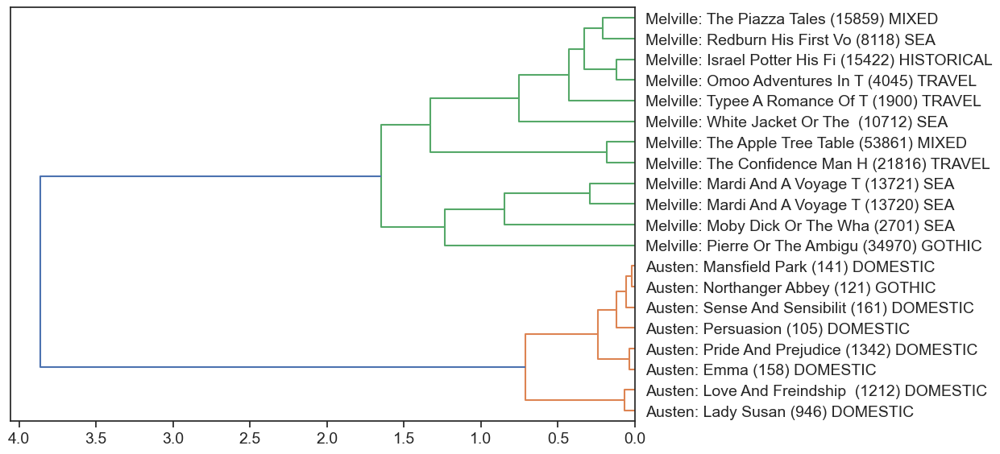

In [71]:
HAC(X).plot();

In [72]:
# fig = create_dendrogram(X, labels=X.index, orientation='left', color_threshold=.3)
# fig.update_layout(width=1000, height=800)
# fig.show()

In [73]:
XV = LOADINGS.loc[VSHORT.sort_values('dfidf', ascending=False).head(100).index]

<Figure size 640x480 with 0 Axes>

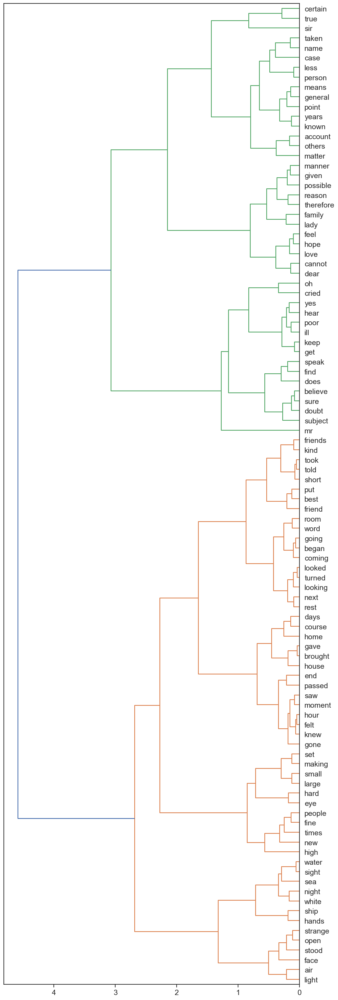

In [74]:
HAC(XV).plot()

In [75]:
# fig = create_dendrogram(XV, labels=XV.index, orientation='left', color_threshold=.05)
# fig.update_layout(width=1000, height=1200)
# fig.show()

In [76]:
XV2 = LOADINGS.loc[VSHORT.sample(50).index]

<Figure size 640x480 with 0 Axes>

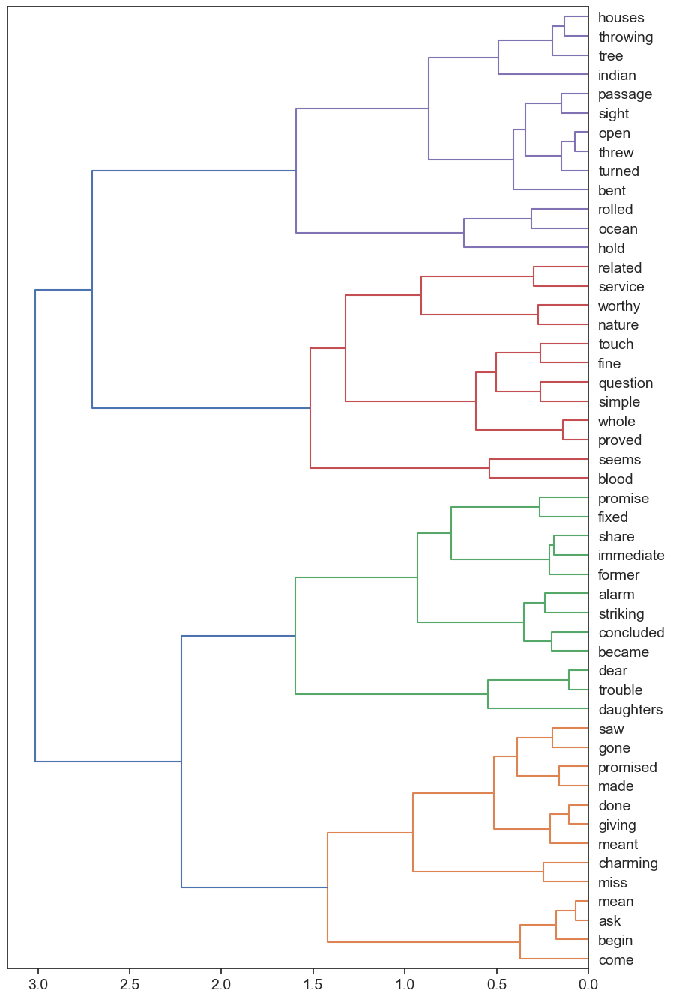

In [77]:
HAC(XV2).plot()

In [78]:
# fig = create_dendrogram(XV2, labels=XV2.index, orientation='left', color_threshold=.05)
# fig.update_layout(width=1000, height=1200)
# fig.show()

# Compare to Scikit Learn

In [100]:
pca_engine = PCA(n_components=10)

In [101]:
DCM_sk = pd.DataFrame(pca_engine.fit_transform(TFIDF_L2), index=TFIDF_L2.index)
DCM_sk.columns = ['PC{}'.format(i) for i in DCM_sk.columns]
DCM_sk = DCM_sk.join(LIB[LIB_COLS], on='book_id')
DCM_sk['doc'] = DCM_sk.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [102]:
DCM_sk.iloc[:10, :10].style.background_gradient(cmap=colors)

## PC 0 and 1

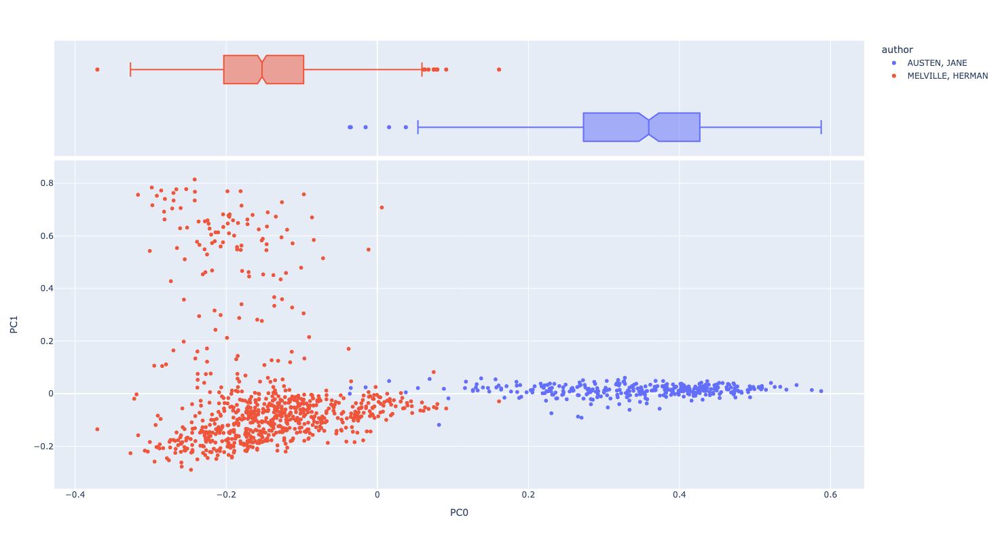

In [103]:
vis_pcs(DCM_sk, 0, 1)

## PC 1 and 2

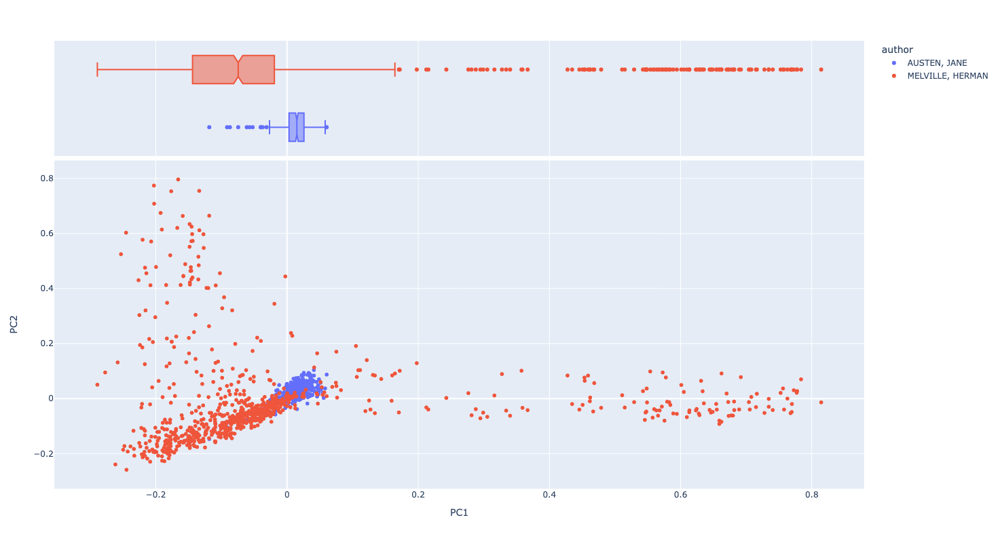

In [104]:
vis_pcs(DCM_sk, 1, 2)

##  PC 2 and 3

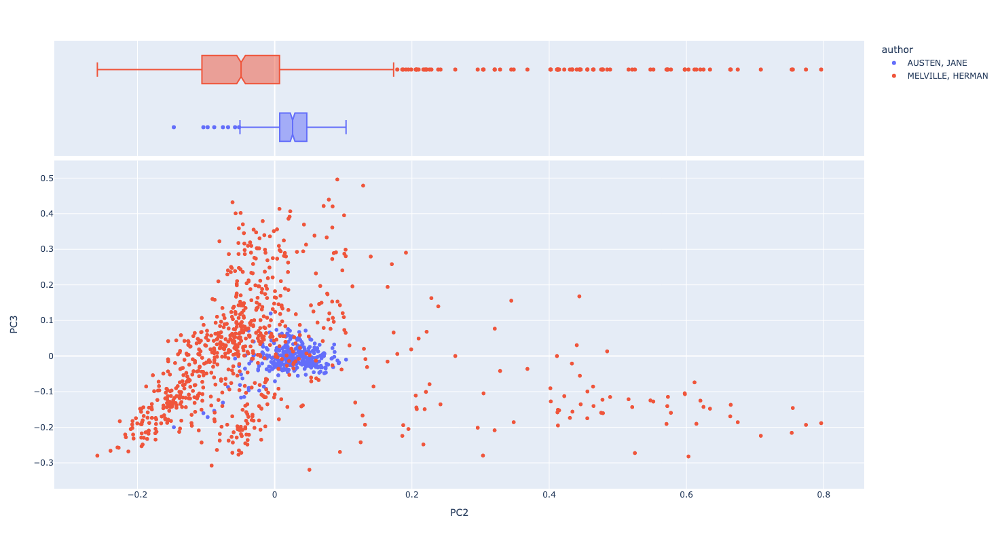

In [105]:
vis_pcs(DCM_sk, 2, 3)

In [85]:
# px.scatter_3d(DCM_sk, 'PC0', 'PC1','PC2', color='author', hover_name='doc', height=1000, width=1200)

In [86]:
# px.scatter_3d(DCM_sk, 'PC0', 'PC1','PC2', color='mode', hover_name='doc', hover_data=['genre'], symbol='author', height=1000, width=1200)

## Get Loadings

In [87]:
LOADINGS_sk = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS_sk.columns = ["PC{}".format(i) for i in LOADINGS_sk.columns]

In [88]:
LOADINGS_sk.index = TFIDF_L2.columns
LOADINGS_sk.index.name = 'term_str'

In [89]:
LOADINGS.sort_values('PC0').head(10)

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_str,,,,,,,,,,
mr,-0.359133,0.019149,0.098639,-0.057521,0.169162,0.047770,0.222253,0.368737,-0.372010,-0.303735
mrs,-0.316634,0.035960,0.068755,-0.048729,0.086124,-0.024085,0.179754,0.160307,0.076685,0.067606
miss,-0.262568,0.022939,0.057441,-0.030862,0.098574,-0.050202,0.083396,0.283301,0.097520,-0.038642
lady,-0.123528,0.009974,0.010487,-0.016538,0.001267,0.043691,0.023191,-0.184951,-0.054663,0.042591
am,-0.115590,0.014955,0.031024,0.043618,0.037755,0.064133,-0.073551,-0.014018,0.020310,0.064757
sister,-0.106060,0.041641,0.017283,-0.022174,0.020493,-0.007067,0.014969,-0.064165,0.102884,0.099417
dear,-0.103155,0.021990,0.022062,0.008452,0.018876,0.039362,-0.049547,-0.045797,-0.021547,0.063078
think,-0.084972,-0.000630,0.010927,-0.001207,0.028711,0.015276,-0.073409,0.028382,0.052864,0.014200
sir,-0.079848,-0.003706,-0.010293,-0.009195,0.142234,0.158342,-0.344841,-0.176064,-0.267374,-0.035800


In [90]:
# LOADINGS_sk['term_str'] = LOADINGS_sk.apply(lambda x: VOCAB.loc[x.name], 1)

In [91]:
top_terms_sk= {}
for i in [0, 1]:
    for j in [0, 1]:
      top_terms_sk[f"{i}_{j}"] = ' '.join(LOADINGS_sk.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())

In [92]:
top_terms_sk

{'0_0': 'mr mrs miss lady am sister dear think sir letter',
 '0_1': 'pierre whale thou sea ship ye thee deck thy boat',
 '1_0': 'pierre thou thee thy mother sister brother soul mrs sweet',
 '1_1': 'whale captain ship deck sea boat sailors ships whales mate'}

# SAVE

In [93]:
TFIDF.to_csv(f"{data_out}/{data_prefix}-TFIDF_chap.csv")
TFIDF_L2.to_csv(f"{data_out}/{data_prefix}-TFIDF_chap_L2.csv")
DCM.iloc[:,:10].to_csv('{}/{}-PCA_DCM_chaps.csv'.format(data_out, data_prefix))
COMPS.iloc[:,[0,-1]].to_csv('{}/{}-PCA_COMPS_chaps.csv'.format(data_out, data_prefix))
LOADINGS.to_csv(f"{data_out}/{data_prefix}-PCA_TCM.csv")

In [117]:
DCM.iloc[:, :10].sample()

,,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
book_id,chap_num,,,,,,,,,,
946,35,-0.146492,0.021808,0.031432,0.02183,-0.04553,0.046182,0.043003,-0.082374,-0.096903,-0.008174


In [183]:
X = DCM.iloc[:,:10]

In [186]:
# DCM_L2 = (DCM.iloc[:,:10].T / norm(DCM.iloc[:,:10], 2, axis=1)).T

In [196]:
POS = X[X > 0].fillna(0)
POS = (POS.T/norm(POS,2,1)).T

NEG = X[X < 0].fillna(0)
NEG = (NEG.T/norm(NEG,2,1)).T
NEG = np.abs(NEG)

In [197]:
NE

PC0       PC1       PC2       PC3       PC4       PC5  \
book_id chap_num                                                               
105     1         0.637144  0.000000  0.000000  0.015803  0.123741  0.000000   
        2         0.646768  0.000000  0.000000  0.027721  0.000000  0.000000   
        3         0.747553  0.058022  0.011370  0.036353  0.000000  0.000000   
        4         0.601766  0.000000  0.066418  0.101213  0.179828  0.000000   
        5         0.985084  0.019714  0.017954  0.098415  0.000000  0.101076   
...                    ...       ...       ...       ...       ...       ...   
53861   8         0.000000  0.188985  0.387919  0.000000  0.335372  0.000000   
        11        0.107890  0.103748  0.207039  0.000000  0.061213  0.000000   
        13        0.000000  0.287942  0.376775  0.000000  0.444166  0.000000   
        14        0.000000  0.110187  0.080059  0.000000  0.160364  0.000000   
        15        0.000000  0.588499  0.497659  0.466665  0.000000  0.000000   

                       PC6       PC7       PC8       PC9  
book_id chap_num                                          
105     1         0.116527  0.675226  0.322904  0.068632  
        2         0.226319  0.605211  0.396407  0.079271  
        3         0.257014  0.000000  0.513464  0.326565  
        4         0.008615  0.768642  0.000000  0.000000  
        5         0.056853  0.032153  0.000000  0.068778  
...                    ...       ...       ...       ...  
53861   8         0.836643  0.000000  0.000000  0.036846  
        11        0.931134  0.021522  0.251898  0.007623  
        13        0.737580  0.000000  0.031796  0.181142  
        14        0.595714  0.283070  0.721616  0.000000  
        15        0.098424  0.112747  0.000000  0.407221  

[1122 rows x 10 columns]